# 1. Introduction: Business Problem

Portugal as become a multicultural country because of mass turism and foreign citizens that decided to move into. This analysis will clear where is the best place to open a restaurant reducing the risk based on population.

There are a lot of restaurants types suchs as: Italian Food; Chinese Food; Brazillian Food; Typical Portuguese; African Food; Indian;

The ideia is that a the better place to open a restaurant is based on: where population has higher income; Portugal Population; Portugal Demographics; Foreign citizens will perfer food from their countries (e.g. Brazillians likes Brazzilian Food, Angola citizen will prefer African Food, ...); Is there competitors in that location?

#### Target Audience:

This would interest to investors who wants to start a new restaurant in Portugal, with focus to foreign comunity that lives in Portugal

# 2. Data
#### Data Source
I will use the Foursquare API to find venues in Portugal where cateregories are related to Food, inside Food Categorie, i will consider only the ones that has the word restaurant (e.g. Afghan Restaurant, African Restaurant, ....)

I will consider 3 majors datasets:

    Portugal Population Distribution: 
    
    https://www.pordata.pt/Municipios/Popula%c3%a7%c3%a3o+residente+total+e+por+grandes+grupos+et%c3%a1rios-390

    Foreign citizens relation with regions that they live in Portugal 
    
    https://www.pordata.pt/Municipios/Popula%c3%a7%c3%a3o+estrangeira+com+estatuto+legal+de+residente+total+e+por+algumas+nacionalidades-101 
    
    It will be possible to cross this data with Forsquare API data to find lack or excess of restaurants relatated with foreight citizens residents in Portugal.

    Income ditribution in Portugal
    
    https://www.pordata.pt/Municipios/Propor%c3%a7%c3%a3o+de+poder+de+compra-119

#### Data cleaning
DataSets were in .xls format, so i had to clean some and convert into .csv
The main problems were:

encoding;
conversions from text to integer;
columns labels;



In [48]:
import types
import pandas as pd
from botocore.client import Config
import ibm_boto3
import seaborn as sns
import matplotlib.pyplot as plt
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import numpy as np # library to handle data in a vectorized manner
#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
import matplotlib as mpl
#!pip install shapely
import shapely.geometry
#!pip install pyproj
import pyproj
import math

In [64]:
# The code was removed by Watson Studio for sharing.

In [50]:
body = client_2fe38ddd6a9847ef85df9a51c36ce494.get_object(Bucket='coursecapstone-donotdelete-pr-0cn0tsujhmxk53',Key='pt-popultion.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

populacao = pd.read_csv(body)
# iam only interessed in 
populacao = populacao[populacao['Territórios'] == 'Município']
populacao['total'].replace(',', '', regex=True, inplace=True)
populacao['total'] = populacao['total'].astype(int)
populacao = populacao.sort_values(by='total', ascending=False)
populacao = populacao[['regiao', 'total']]
populacao = populacao.rename(columns={"total": "total_citiz"})
populacao.head()

,regiao,total_citiz
213,Lisboa,506654
224,Sintra,387236
47,Vila Nova de Gaia,299879
38,Porto,214936
212,Cascais,212094


In [51]:
print('Lisboa is the most populated region in Portugal. It is a good candidate to start a restaurante bussiness.')

Lisboa is the most populated region in Portugal. It is a good candidate to start a restaurante bussiness.


In [52]:
body2 = client_2fe38ddd6a9847ef85df9a51c36ce494.get_object(Bucket='coursecapstone-donotdelete-pr-0cn0tsujhmxk53',Key='pt-income.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body2, "__iter__"): body2.__iter__ = types.MethodType( __iter__, body2 )   

income = pd.read_csv(body2)
income = income[income['tipo'] == 'Município']
income['income'] = income['income'].astype(float)
income = income.sort_values(by='income', ascending=False)
income = income[['regiao', 'income']]
income.head()

,regiao,income
213,Lisboa,10.466
224,Sintra,3.550
38,Porto,3.350
47,Vila Nova de Gaia,2.901
219,Oeiras,2.633


In [53]:
print('Lisboa is also the region where exists more money...')

Lisboa is also the region where exists more money...


In [54]:
body3 = client_2fe38ddd6a9847ef85df9a51c36ce494.get_object(Bucket='coursecapstone-donotdelete-pr-0cn0tsujhmxk53',Key='pt-imigration.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body3, "__iter__"): body3.__iter__ = types.MethodType( __iter__, body3 )


%matplotlib inline 
    
foreigh = pd.read_csv(body3)
foreigh.replace(',', '', regex=True, inplace=True)
foreigh['Total'] = foreigh['Total'].astype(int)
foreigh['Espanha'] = foreigh['Espanha'].astype(int)
foreigh['Franca'] = foreigh['Franca'].astype(int)
foreigh['Reino Unido'] = foreigh['Reino Unido'].astype(int)
foreigh['Ucrania'] = foreigh['Ucrania'].astype(int)
foreigh['Romenia'] = foreigh['Romenia'].astype(int)
foreigh['Moldavia'] = foreigh['Moldavia'].astype(int)
foreigh['others_ue'] = foreigh['others_ue'].astype(int)
foreigh['Angola'] = foreigh['Angola'].astype(int)
foreigh['Cabo_Verde'] = foreigh['Cabo_Verde'].astype(int)
foreigh['Guine_Bissau'] = foreigh['Guine_Bissau'].astype(int)
foreigh['Mocambique'] = foreigh['Mocambique'].astype(int)
foreigh['Sao_Tome_Principe'] = foreigh['Sao_Tome_Principe'].astype(int)
foreigh['others_african'] = foreigh['others_african'].astype(int)
foreigh['Brasil'] = foreigh['Brasil'].astype(int)
foreigh['others_americans'] = foreigh['others_americans'].astype(int)
foreigh['China'] = foreigh['China'].astype(int)
foreigh['india'] = foreigh['india'].astype(int)
foreigh['Nepal'] = foreigh['Nepal'].astype(int)
foreigh['others_asian'] = foreigh['others_asian'].astype(int)
foreigh['pt_africans'] = foreigh['Angola'] + foreigh['Cabo_Verde'] + foreigh['Mocambique'] + foreigh['Sao_Tome_Principe'] + foreigh['Guine_Bissau']
foreigh = foreigh.sort_values(by='Total', ascending=False)
foreigh.sum()

tipo                 MunicípioMunicípioMunicípioMunicípioMunicípioM...
regiao               LisboaSintraCascaisAmadoraLouresLouléOdivelasA...
Total                                                           477472
Espanha                                                          14066
Franca                                                           19771
Reino Unido                                                      26445
Ucrania                                                          29197
Romenia                                                          30908
Moldavia                                                          4834
others_ue                                                        77077
Angola                                                           18310
Cabo_Verde                                                       34444
Guine_Bissau                                                     15960
Mocambique                                                        2999
Sao_To

Viewing the data, i realized that can merge all african countries in 1 column and then i realized that the foreign comunities most representative are African (80736) and Brazilian (104504)

In [55]:
new_foreign = foreigh[['regiao', 'Total', 'pt_africans', 'Brasil']]
new_foreign = new_foreign.rename(columns={"Total": "total_foreign_citiz", "pt_africans": "from_africa", "Brasil": "from_brasil"})
new_foreign.head(16)

,regiao,total_foreign_citiz,from_africa,from_brasil
191,Lisboa,78614,6653,12021
202,Sintra,31807,16194,6240
190,Cascais,25199,2656,6909
188,Amadora,17797,10005,3020
192,Loures,16605,6918,2650
269,Loulé,14945,990,1892
196,Odivelas,14266,4609,3033
262,Albufeira,12350,746,1989
31,Porto,11634,1281,4256
187,Almada,10145,3258,3072


In [56]:
df = populacao.join(income.set_index('regiao'), on='regiao')

(0, 1170296.8773862976)

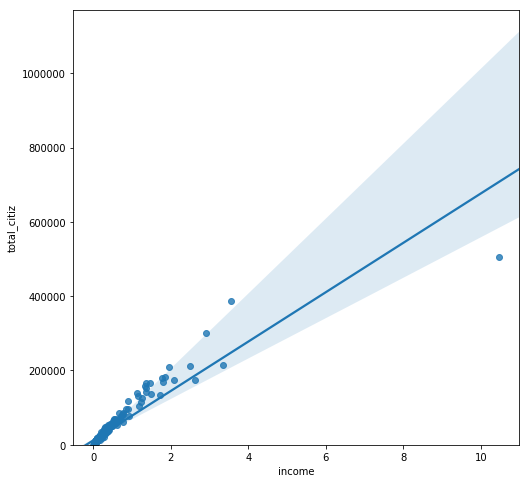

In [57]:
%matplotlib inline 
width = 8
height = 8
plt.figure(figsize=(width, height))
sns.regplot(x="income", y="total_citiz", data=df)
plt.ylim(0,)

I found that a polulation is related to the income as you can see in this plot

The focus of the study will be in Lisbon and restaurants typical African or Brasilian.

Create a grid of areas centered around city center and within 5km from Lisbon. Our areas will be defined as circular areas with a radius of 300 meters,

In [58]:
def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

In [59]:
city_center = [38.750898,-9.1576577]
x, y = lonlat_to_xy(city_center[1], city_center[0])
lo, la = xy_to_lonlat(x, y)

city_center_x, city_center_y = lonlat_to_xy(city_center[1], city_center[0])

k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_min = city_center_x - 5000
x_step = 600
y_min = city_center_y - 5000 - (int(21/k)*k*600 - 10000)/2
y_step = 600 * k 

latitudes = []
longitudes = []
distances_from_center = []
xs = []
ys = []
for i in range(0, int(21/k)):
    y = y_min + i * y_step
    x_offset = 300 if i%2==0 else 0
    for j in range(0, 21):
        x = x_min + j * x_step + x_offset
        distance_from_center = calc_xy_distance(city_center_x, city_center_y, x, y)
        if (distance_from_center <= 5001):
            lon, lat = xy_to_lonlat(x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_center.append(distance_from_center)
            xs.append(x)
            ys.append(y)

city_map = folium.Map(location=city_center, zoom_start=13)
folium.Marker(city_center, popup='LISBOA').add_to(city_map)
for lat, lon in zip(latitudes, longitudes):
    folium.Circle([lat, lon], radius=300, color='blue', fill=False).add_to(city_map)
city_map

In [60]:
import pandas as pd

df_locations = pd.DataFrame({'Latitude': latitudes,
                             'Longitude': longitudes,
                             'X': xs,
                             'Y': ys,
                             'Distance from center': distances_from_center})

df_locations.head()

,Latitude,Longitude,X,Y,Distance from center
0,38.709223,-9.158571,-1.612803e+06,4.572631e+06,4881.598099
1,38.710607,-9.152276,-1.612203e+06,4.572631e+06,4744.470466
2,38.711991,-9.145980,-1.611603e+06,4.572631e+06,4680.811895
3,38.713374,-9.139684,-1.611003e+06,4.572631e+06,4693.612681
4,38.714757,-9.133387,-1.610403e+06,4.572631e+06,4782.258880


In [102]:
food_category = '4d4b7105d754a06374d81259' # 'Root' category for all food-related venues

italian_restaurant_categories = ['44bf58dd8d48988d16b941735','4bf58dd8d48988d1c8941735']

def is_restaurant(categories, specific_filter=None):
    restaurant_words = ['restaurant', 'diner', 'taverna', 'steakhouse']
    restaurant = False
    specific = False
    for c in categories:
        category_name = c[0].lower()
        category_id = c[1]
        for r in restaurant_words:
            if r in category_name:
                restaurant = True
        if 'fast food' in category_name:
            restaurant = False
        if not(specific_filter is None) and (category_id in specific_filter):
            specific = True
            restaurant = True
    return restaurant, specific

def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def get_venues_near_location(lat, lon, category, client_id, client_secret, radius=500, limit=100):
    version = '20180724'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lon, category, radius, limit)
    #print(url)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        venues = [(item['venue']['id'],
                   item['venue']['name'],
                   get_categories(item['venue']['categories']),
                   (item['venue']['location']['lat'], item['venue']['location']['lng']),
                   item['venue']['location'],
                   item['venue']['location']['distance']) for item in results]        
    except:
        venues = []
    return venues

In [103]:
import pickle

def get_restaurants(lats, lons):
    restaurants = {}
    my_restaurants = {}
    location_restaurants = []

    print('Obtaining venues around candidate locations:', end='')
    for lat, lon in zip(lats, lons):
        # Using radius=350 to meke sure we have overlaps/full coverage so we don't miss any restaurant (we're using dictionaries to remove any duplicates resulting from area overlaps)
        venues = get_venues_near_location(lat, lon, food_category, foursquare_client_id, foursquare_client_secret, radius=350, limit=500)
        area_restaurants = []
        for venue in venues:
            venue_id = venue[0]
            venue_name = venue[1]
            venue_categories = venue[2]
            venue_latlon = venue[3]
            venue_address = venue[4]
            venue_distance = venue[5]
            is_res, is_italian = is_restaurant(venue_categories, specific_filter=italian_restaurant_categories)
            if is_res:
                x, y = lonlat_to_xy(venue_latlon[1], venue_latlon[0])
                restaurant = (venue_id, venue_name, venue_latlon[0], venue_latlon[1], venue_address, venue_distance, is_italian, x, y)
                if venue_distance<=300:
                    area_restaurants.append(restaurant)
                restaurants[venue_id] = restaurant
                if is_italian:
                    my_restaurants[venue_id] = restaurant
        location_restaurants.append(area_restaurants)
        print(' .', end='')
    print(' done.')
    return restaurants, my_restaurants, location_restaurants

# Try to load from local file system in case we did this before
restaurants = {}
my_restaurants = {}
location_restaurants = []
loaded = False
try:
    with open('restaurants.pkl', 'rb') as f:
        restaurants = pickle.load(f)
    with open('my_restaurants.pkl', 'rb') as f:
        my_restaurants = pickle.load(f)
    with open('location_restaurants.pkl', 'rb') as f:
        location_restaurants = pickle.load(f)
    print('Restaurant data loaded.')
    loaded = True
except:
    pass

# If load failed use the Foursquare API to get the data
if not loaded:
    restaurants, my_restaurants, location_restaurants = get_restaurants(latitudes, longitudes)
    
    # Let's persists this in local file system
    with open('restaurants.pkl', 'wb') as f:
        pickle.dump(restaurants, f)
    with open('my_restaurants.pkl', 'wb') as f:
        pickle.dump(my_restaurants, f)
    with open('location_restaurants.pkl', 'wb') as f:
        pickle.dump(location_restaurants, f)
        

Restaurant data loaded.


In [104]:
import numpy as np

print('Total number of restaurants:', len(restaurants))
print('Total number of African or Brazilian restaurants:', len(my_restaurants))
print('Percentage of African or Brazilian restaurants: {:.2f}%'.format(len(my_restaurants) / len(restaurants) * 100))
print('Average number of restaurants in area:', np.array([len(r) for r in location_restaurants]).mean())

Total number of restaurants: 1192
Total number of African or Brazilian restaurants: 8
Percentage of African or Brazilian restaurants: 0.67%
Average number of restaurants in area: 4.430278884462151


In [67]:
map = folium.Map(location=city_center, zoom_start=13)
folium.Marker(city_center, popup='Lisboa').add_to(map)
for res in restaurants.values():
    lat = res[2]; lon = res[3]
    is_italian = res[6]
    color = 'red' if is_italian else 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map)
map

This map represents the distribution of restaurants (in blue) in Lisbon and whitch ones are Brazilian or African (in red)

# Methodology

In this report i will detect areas in Lisbon that have low restaurant density, particularly those with low number of African or Brazilian restaurants. 
The analysis will be limit 5km area around city center.

I will collect data from Foursquare API to identify restaurants and also African or Brazilian restaurants(according to Foursquare categorization).

Next i will calculate density os all restaurants

Heatmaps will help to identify some areas with low number of restaurants in general (and no African/Brazilian).

Study one of those areas using k-means.

Cluster the results in a map

In [68]:
location_restaurants_count = [len(res) for res in location_restaurants]

df_locations['Restaurants in area'] = location_restaurants_count

print('Average number of restaurants in every area with radius=300m:', np.array(location_restaurants_count).mean())

df_locations.head(10)

Average number of restaurants in every area with radius=300m: 4.430278884462151


,Latitude,Longitude,X,Y,Distance from center,Restaurants in area
0,38.709223,-9.158571,-1.612803e+06,4.572631e+06,4881.598099,16
1,38.710607,-9.152276,-1.612203e+06,4.572631e+06,4744.470466,23
2,38.711991,-9.145980,-1.611603e+06,4.572631e+06,4680.811895,51
3,38.713374,-9.139684,-1.611003e+06,4.572631e+06,4693.612681,62
4,38.714757,-9.133387,-1.610403e+06,4.572631e+06,4782.258880,27
5,38.716140,-9.127090,-1.609803e+06,4.572631e+06,4942.671343,13
6,38.711417,-9.169544,-1.613703e+06,4.573151e+06,4750.789408,1
7,38.712802,-9.163249,-1.613103e+06,4.573151e+06,4491.102315,5
8,38.714186,-9.156953,-1.612503e+06,4.573151e+06,4300.000000,6
9,38.715571,-9.150658,-1.611903e+06,4.573151e+06,4186.884283,16


In [69]:
distances_to_my_restaurant = []

for area_x, area_y in zip(xs, ys):
    min_distance = 10000
    for res in my_restaurants.values():
        res_x = res[7]
        res_y = res[8]
        d = calc_xy_distance(area_x, area_y, res_x, res_y)
        if d<min_distance:
            min_distance = d
    distances_to_my_restaurant.append(min_distance)

df_locations['Distance to My restaurant'] = distances_to_my_restaurant
df_locations.head()

,Latitude,Longitude,X,Y,Distance from center,Restaurants in area,Distance to My restaurant
0,38.709223,-9.158571,-1.612803e+06,4.572631e+06,4881.598099,16,686.159863
1,38.710607,-9.152276,-1.612203e+06,4.572631e+06,4744.470466,23,117.481258
2,38.711991,-9.145980,-1.611603e+06,4.572631e+06,4680.811895,51,526.106771
3,38.713374,-9.139684,-1.611003e+06,4.572631e+06,4693.612681,62,377.915614
4,38.714757,-9.133387,-1.610403e+06,4.572631e+06,4782.258880,27,222.408920


In [99]:
print('Average distance to closest African/Brazilian restaurant from each area center:', df_locations['Distance to My restaurant'].mean())

Average distance to closest African/Brazilian restaurant from each area center: 1847.5589175433054


I can find an African/ Brazilian restaurant in each 2 km

heatmap / density of restaurants


In [71]:
restaurant_latlons = [[res[2], res[3]] for res in restaurants.values()]

my_latlons = [[res[2], res[3]] for res in my_restaurants.values()]

from folium import plugins
from folium.plugins import HeatMap

city_map = folium.Map(location=city_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(city_map) #cartodbpositron cartodbdark_matter
HeatMap(restaurant_latlons).add_to(city_map)
folium.Marker(city_center).add_to(city_map)
folium.Circle(city_center, radius=1000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=2000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=3000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=4000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=5000, fill=False, color='white').add_to(city_map)
city_map

heatmap / density of restaurants only for African / Brazilian type

In [72]:
city_map = folium.Map(location=city_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(city_map) #cartodbpositron cartodbdark_matter
HeatMap(my_latlons).add_to(city_map)
folium.Marker(city_center).add_to(city_map)
folium.Circle(city_center, radius=1000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=2000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=3000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=4000, fill=False, color='white').add_to(city_map)
folium.Circle(city_center, radius=5000, fill=False, color='white').add_to(city_map)
city_map

Putting the center o map near by Marvila (location in Lisbon) that has lower density of restaurants

In [74]:
roi_x_min = city_center_x + 1000
roi_y_max = city_center_y + 1000
roi_width = 5000
roi_height = 5000
roi_center_x = roi_x_min + 2500
roi_center_y = roi_y_max - 2500
roi_center_lon, roi_center_lat = xy_to_lonlat(roi_center_x, roi_center_y)
roi_center = [roi_center_lat, roi_center_lon]

city_map = folium.Map(location=roi_center, zoom_start=14)
HeatMap(restaurant_latlons).add_to(city_map)
folium.Marker(city_center).add_to(city_map)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.4).add_to(city_map)
city_map

In [75]:
k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_step = 100
y_step = 100 * k 
roi_y_min = roi_center_y - 2500

roi_latitudes = []
roi_longitudes = []
roi_xs = []
roi_ys = []
for i in range(0, int(51/k)):
    y = roi_y_min + i * y_step
    x_offset = 50 if i%2==0 else 0
    for j in range(0, 51):
        x = roi_x_min + j * x_step + x_offset
        d = calc_xy_distance(roi_center_x, roi_center_y, x, y)
        if (d <= 2501):
            lon, lat = xy_to_lonlat(x, y)
            roi_latitudes.append(lat)
            roi_longitudes.append(lon)
            roi_xs.append(x)
            roi_ys.append(y)

print(len(roi_latitudes), 'candidate areas centers generated.')

2261 candidate neighborhood centers generated.


In [76]:
def count_restaurants_nearby(x, y, restaurants, radius=250):    
    count = 0
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

def find_nearest_restaurant(x, y, restaurants):
    d_min = 100000
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=d_min:
            d_min = d
    return d_min

roi_restaurant_counts = []
roi_italian_distances = []

print('Generating data on location candidates... ', end='')
for x, y in zip(roi_xs, roi_ys):
    count = count_restaurants_nearby(x, y, restaurants, radius=250)
    roi_restaurant_counts.append(count)
    distance = find_nearest_restaurant(x, y, my_restaurants)
    roi_italian_distances.append(distance)
print('done.')


Generating data on location candidates... done.


In [100]:
# Let's put this into dataframe
df_roi_locations = pd.DataFrame({'Latitude':roi_latitudes,
                                 'Longitude':roi_longitudes,
                                 'X':roi_xs,
                                 'Y':roi_ys,
                                 'Restaurants nearby':roi_restaurant_counts,
                                 'Distance to my restaurant':roi_italian_distances})

df_roi_locations.head(10)

,Latitude,Longitude,X,Y,Restaurants nearby,Distance to my restaurant
0,38.725966,-9.109661,-1.607953e+06,4.573308e+06,0,2758.870659
1,38.726196,-9.108611,-1.607853e+06,4.573308e+06,0,2855.837571
2,38.725411,-9.115690,-1.608503e+06,4.573394e+06,0,2258.489052
3,38.725641,-9.114640,-1.608403e+06,4.573394e+06,0,2352.703491
4,38.725872,-9.113590,-1.608303e+06,4.573394e+06,0,2447.377093
5,38.726102,-9.112540,-1.608203e+06,4.573394e+06,0,2542.458565
6,38.726332,-9.111490,-1.608103e+06,4.573394e+06,0,2637.903803
7,38.726563,-9.110441,-1.608003e+06,4.573394e+06,0,2733.674705
8,38.726793,-9.109391,-1.607903e+06,4.573394e+06,0,2829.738206
9,38.727024,-9.108341,-1.607803e+06,4.573394e+06,0,2926.065487


In [101]:
good_res_count = np.array((df_roi_locations['Restaurants nearby']<=2))
print('Locations with no more than two restaurants nearby:', good_res_count.sum())

good_ita_distance = np.array(df_roi_locations['Distance to my restaurant']>=400)
print('Locations with no African/Brazilian restaurants within 400:', good_ita_distance.sum())

good_locations = np.logical_and(good_res_count, good_ita_distance)
print('Locations with both conditions met:', good_locations.sum())

df_good_locations = df_roi_locations[good_locations]

Locations with no more than two restaurants nearby: 1851
Locations with no African/Brazilian restaurants within 400: 2203
Locations with both conditions met: 1827


In [85]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

city_map = folium.Map(location=roi_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(city_map)
HeatMap(restaurant_latlons).add_to(city_map)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.6).add_to(city_map)
folium.Marker(city_center).add_to(city_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(city_map) 
city_map

In [86]:
city_map = folium.Map(location=roi_center, zoom_start=14)
HeatMap(good_locations, radius=25).add_to(city_map)
folium.Marker(city_center).add_to(city_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(city_map)
city_map

In [87]:
from sklearn.cluster import KMeans

number_of_clusters = 15

good_xys = df_good_locations[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)

cluster_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in kmeans.cluster_centers_]

city_map = folium.Map(location=roi_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(city_map)
HeatMap(restaurant_latlons).add_to(city_map)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.4).add_to(city_map)
folium.Marker(city_center).add_to(city_map)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=True, fill_opacity=0.25).add_to(city_map) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(city_map)
city_map

In [88]:
city_map = folium.Map(location=roi_center, zoom_start=14)
folium.Marker(city_center).add_to(city_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#00000000', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(city_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(city_map)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(city_map) 
city_map

In [89]:
city_map = folium.Map(location=[38.7483942, -9.1305304], zoom_start=15)
folium.Marker(city_center).add_to(city_map)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(city_map) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#0000ff00', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(city_map)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(city_map)
city_map